<a href="https://colab.research.google.com/github/aniketambasta/mlops_final_project/blob/master/final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from PIL import Image 
import PIL 
import cv2
from PIL import Image, ImageFilter
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.constraints import maxnorm
from keras.optimizers import SGD
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.utils import np_utils


In [ ]:
# taking input images

im1 = Image.open(r"/content/drive/My Drive/MLOps_project/4.jpeg")
im1.show()
im2 = cv2.imread(r'/content/WhatsApp Image 2020-08-21 at 4.04.05 AM.jpeg')
face_square = cv2.imread('/content/WhatsApp Image 2020-08-21 at 4.04.05 AM.jpeg')


Successfully saved


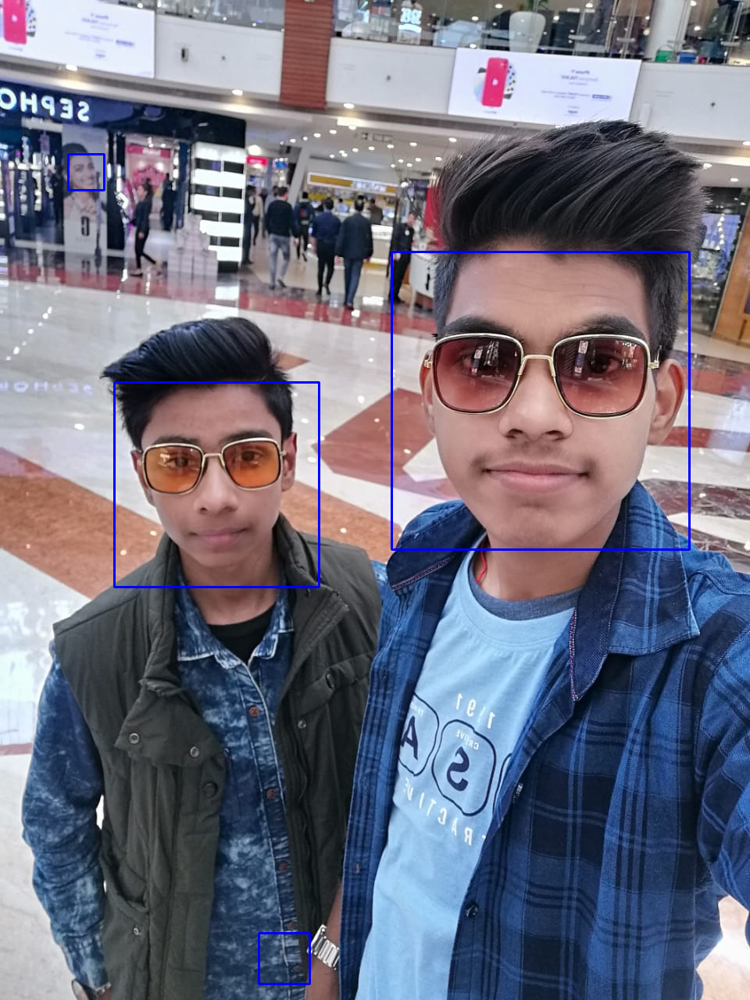

In [ ]:
face_cascade = cv2.CascadeClassifier("/content/drive/My Drive/MLOps_project/face_recog.xml")


faces = face_cascade.detectMultiScale(im2, 1.1, 4)
for (x, y, w, h) in faces: 
  cv2.rectangle(face_square, (x, y), (x+w, y+h), (255, 0, 0), 2)
  cv2.imwrite("face_detected.png", face_square)
print('Successfully saved')

cv2_imshow(face_square)

In [ ]:
from keras.datasets import cifar10
import matplotlib.pyplot as plt
 
(train_X,train_Y),(test_X,test_Y)=cifar10.load_data()

In [ ]:
train_x=train_X.astype('float32')
test_X=test_X.astype('float32')
 
train_X=train_X/255.0
test_X=test_X/255.0

In [ ]:
train_Y=np_utils.to_categorical(train_Y)
test_Y=np_utils.to_categorical(test_Y)
 
num_classes=test_Y.shape[1]

In [ ]:
model=Sequential()
model.add(Conv2D(32,(3,3),input_shape=(32,32,3),
    padding='same',activation='relu',
    kernel_constraint=maxnorm(3)))
model.add(Dropout(0.2))
model.add(Conv2D(32,(3,3),activation='relu',padding='same',kernel_constraint=maxnorm(3)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(512,activation='relu',kernel_constraint=maxnorm(3)))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

In [ ]:
sgd=SGD(lr=0.01,momentum=0.9,decay=(0.01/25),nesterov=False)
 
model.compile(loss='categorical_crossentropy',
  optimizer=sgd,
  metrics=['accuracy'])


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 32)        896       
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               4194816   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0

In [ ]:
model.fit(train_X,train_Y,
    validation_data=(test_X,test_Y),
    epochs=10,batch_size=32)

Epoch 1/10
1563/1563 [==============================] - 219s 140ms/step - loss: 1.6838 - accuracy: 0.3884 - val_loss: 1.3611 - val_accuracy: 0.5215
Epoch 2/10
1563/1563 [==============================] - 222s 142ms/step - loss: 1.3084 - accuracy: 0.5318 - val_loss: 1.1987 - val_accuracy: 0.5743
Epoch 3/10
1563/1563 [==============================] - 218s 140ms/step - loss: 1.1327 - accuracy: 0.5971 - val_loss: 1.0573 - val_accuracy: 0.6248
Epoch 4/10
1563/1563 [==============================] - 219s 140ms/step - loss: 1.0104 - accuracy: 0.6401 - val_loss: 0.9843 - val_accuracy: 0.6519
Epoch 5/10
1563/1563 [==============================] - 222s 142ms/step - loss: 0.9137 - accuracy: 0.6784 - val_loss: 0.9384 - val_accuracy: 0.6718
Epoch 6/10
1563/1563 [==============================] - 219s 140ms/step - loss: 0.8238 - accuracy: 0.7113 - val_loss: 0.9070 - val_accuracy: 0.6812
Epoch 7/10
1563/1563 [==============================] - 219s 140ms/step - loss: 0.7611 - accuracy: 0.7303 - val_

In [ ]:
_,acc=model.evaluate(test_X,test_Y)
print(acc*100)

313/313 [==============================] - 9s 29ms/step - loss: 0.8703 - accuracy: 0.7009
70.09000182151794


In [ ]:
model.save("model1_cifar_10epoch.h5")

1 automobile


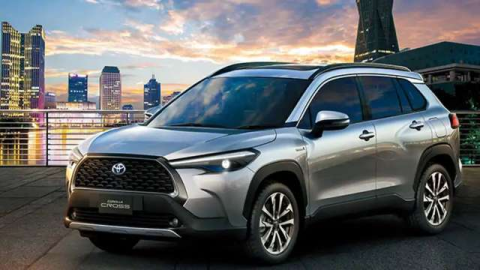

In [ ]:
results={
   0:'aeroplane',
   1:'automobile',
   2:'bird',
   3:'cat',
   4:'deer',
   5:'dog',
   6:'frog',
   7:'horse',
   8:'ship',
   9:'truck'
}
from PIL import Image
import numpy as np
im=Image.open("/content/drive/My Drive/car.jpg")
# the input image is required to be in the shape of dataset, i.e (32,32,3)
im=im.resize((32,32))
im=np.expand_dims(im,axis=0)
im=np.array(im)
pred=model.predict_classes([im])[0]
print(pred,results[pred])
import cv2  
img = cv2.imread('/content/drive/My Drive/car.jpg', 1)  
scale = 60  
width = int(img.shape[1] * scale / 80)  
height = int(img.shape[0] * scale / 80)  
dim = (width, height)  
# resize image  
resized = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)  
#print('Resized Dimensions : ', resized.shape)  
from google.colab.patches import cv2_imshow
cv2_imshow(resized) 

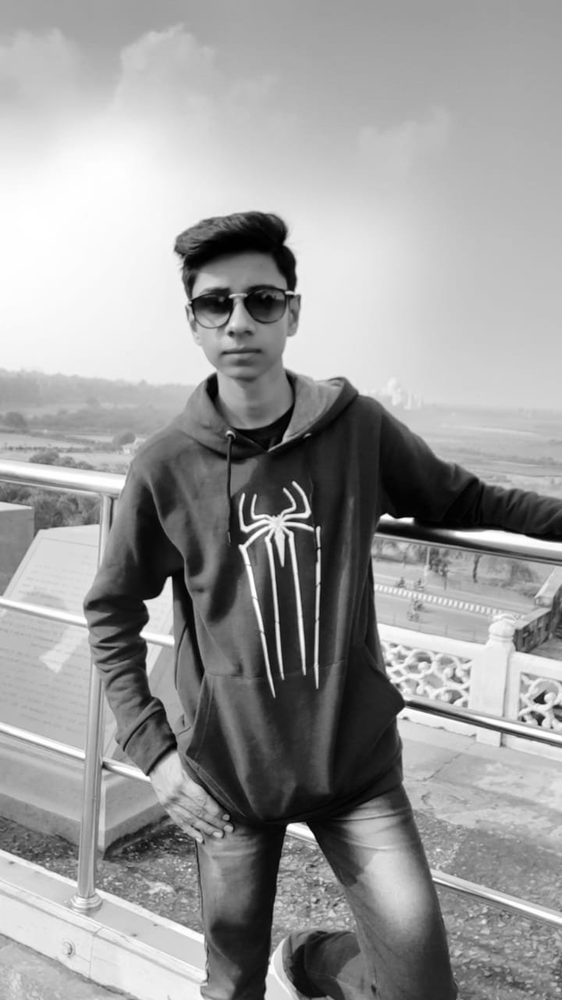

In [ ]:
#grey and white and black and white
n= 1
grayImage = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
  
(thresh, blackAndWhiteImage) = cv2.threshold(grayImage, 127, 255, cv2.THRESH_BINARY)
 

cv2_imshow(grayImage)

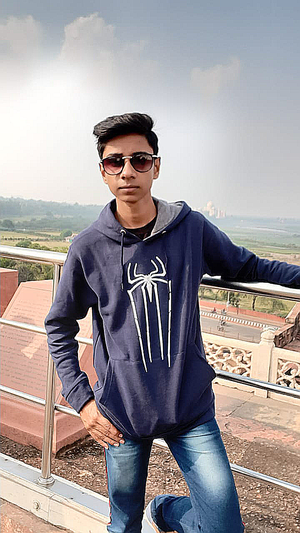

In [ ]:
# Edge Enhancer 
im3 = im1.filter(ImageFilter.EDGE_ENHANCE_MORE) 


basewidth = 300
#moreEdgeEnahnced = Image.open('moreEdgeEnahnced')
wpercent = (basewidth/float(im3.size[0]))
hsize = int((float(im3.size[1])*float(wpercent)))
im3 = im3.resize((basewidth,hsize), Image.ANTIALIAS)



#plt.imshow(im3) 
im3

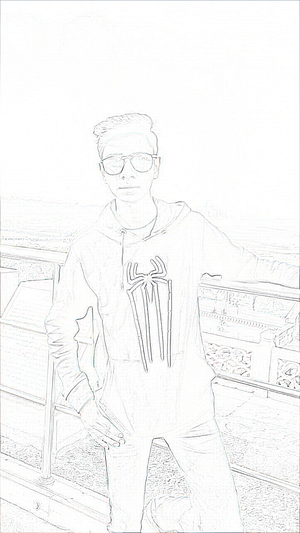

In [ ]:
#contour filter
im = im1.filter(ImageFilter.CONTOUR) 

#im.show()
#plt.imshow(im) 
basewidth = 300
#moreEdgeEnahnced = Image.open('moreEdgeEnahnced')
wpercent = (basewidth/float(im.size[0]))
hsize = int((float(im.size[1])*float(wpercent)))
im = im.resize((basewidth,hsize), Image.ANTIALIAS)


im

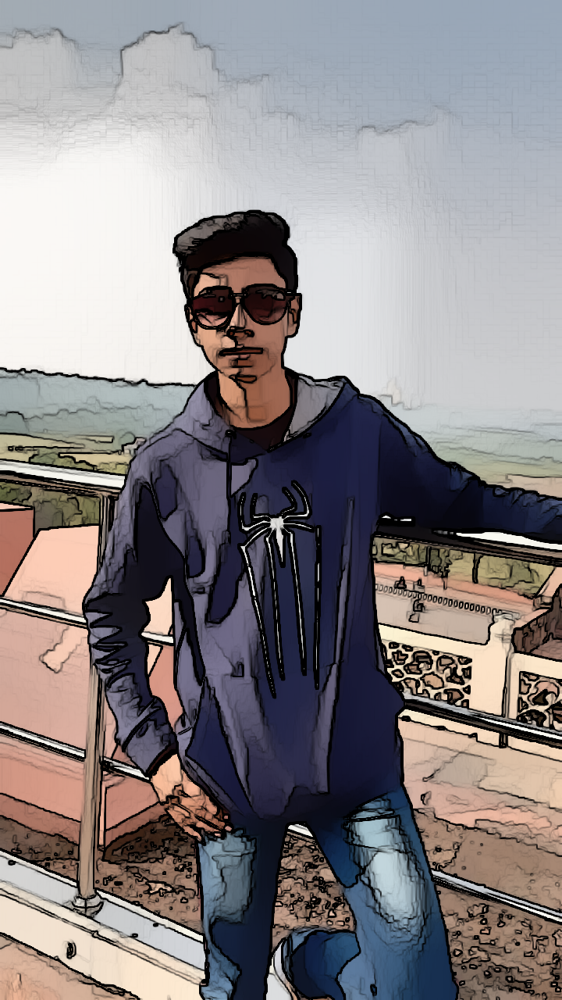

In [ ]:
#cartoon image

cartoon_image = cv2.stylization(im2, sigma_s=150, sigma_r=0.25)  
#cv2.imshow('cartoon', cartoon_image)  
#cv2.waitKey()  
#cv2.destroyAllWindows()


cv2_imshow(cartoon_image)




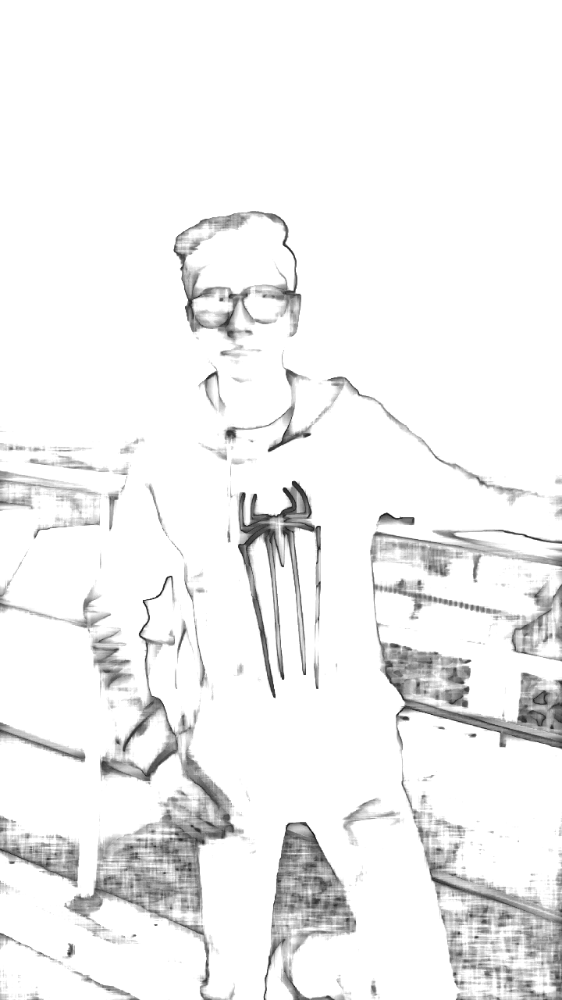

In [ ]:
#pencil sketch

cartoon_image1, cartoon_image2  = cv2.pencilSketch(im2, sigma_s=60, sigma_r=0.5, shade_factor=0.02)  
#cv2.imshow("pencil", cartoon_image1)  
#cv2.waitKey()  
#cv2.destroyAllWindows()
cv2_imshow(cartoon_image1)

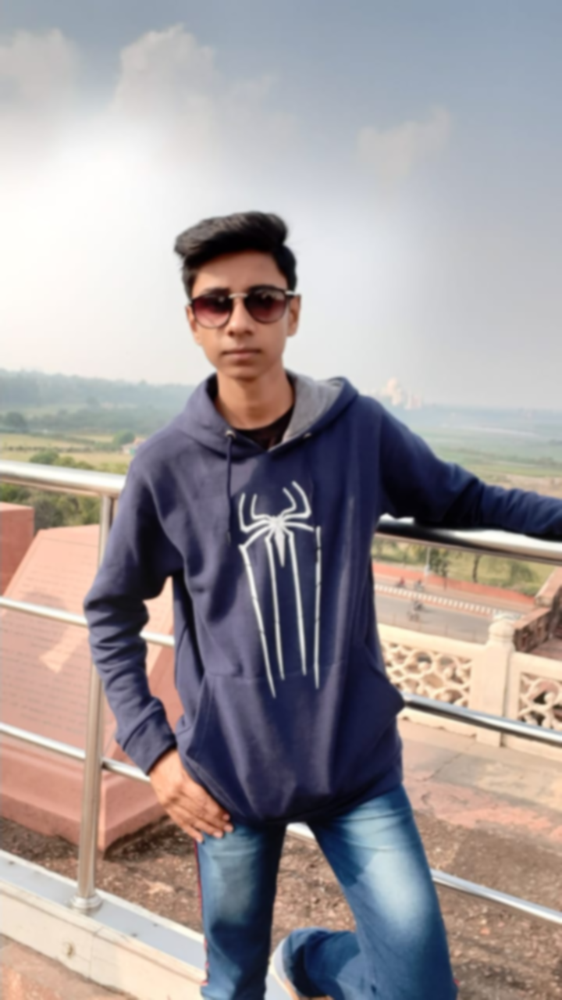

In [ ]:
#blurr image
blurr = cv2.GaussianBlur(im2, (7, 7), 0)
cv2_imshow(blurr)

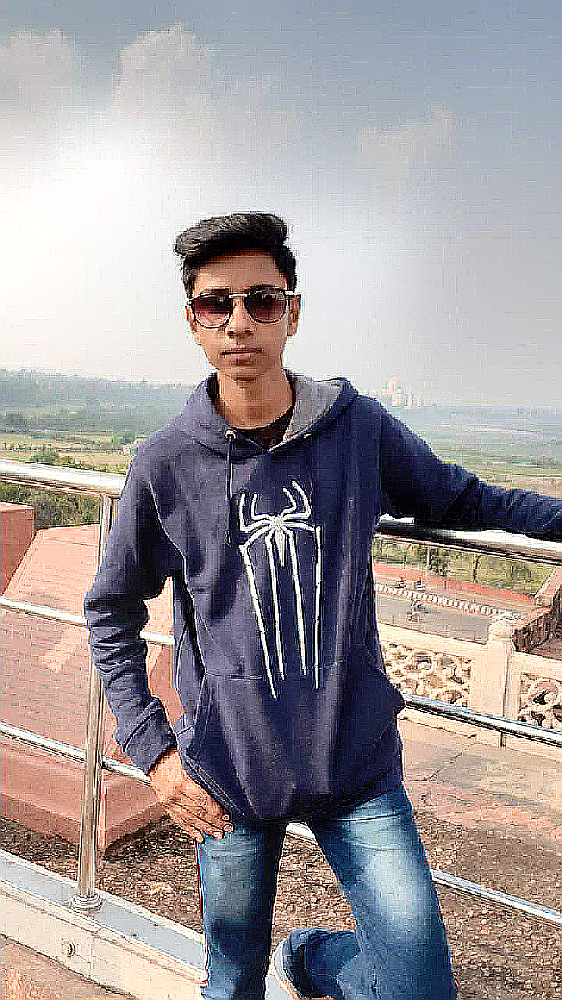

In [ ]:
# Apply sharp filter
sharpened1 = im1.filter(ImageFilter.SHARPEN);
sharpened2 = sharpened1.filter(ImageFilter.SHARPEN);
sharpened3 = sharpened2.filter(ImageFilter.SHARPEN);
sharpened4 = sharpened3.filter(ImageFilter.SHARPEN);

# Show the sharpened images
#sharpened1.show();
#sharpened2.show();
#plt.imshow(sharpened1)
#plt.imshow(sharpened4)
sharpened4

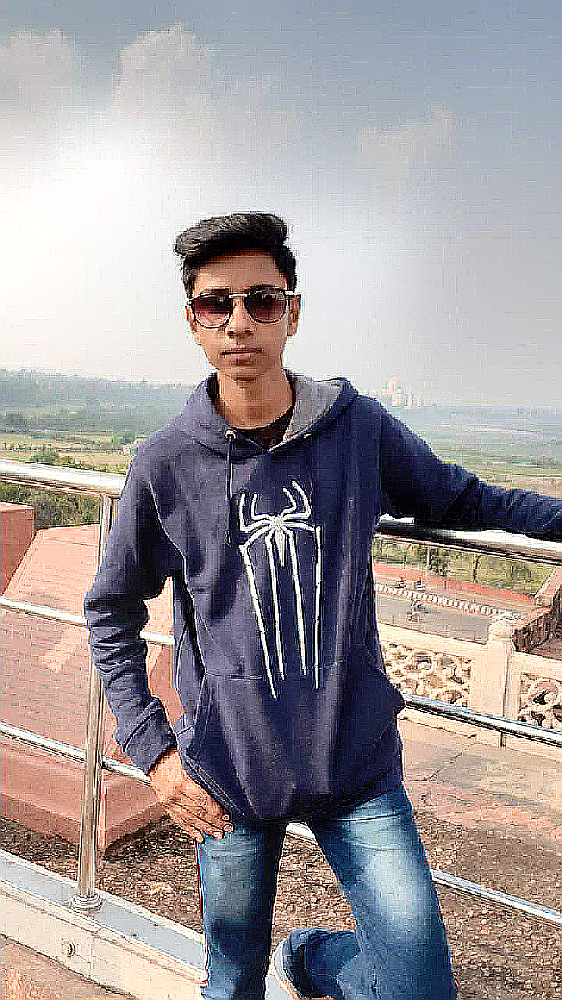

In [ ]:
sharpened4

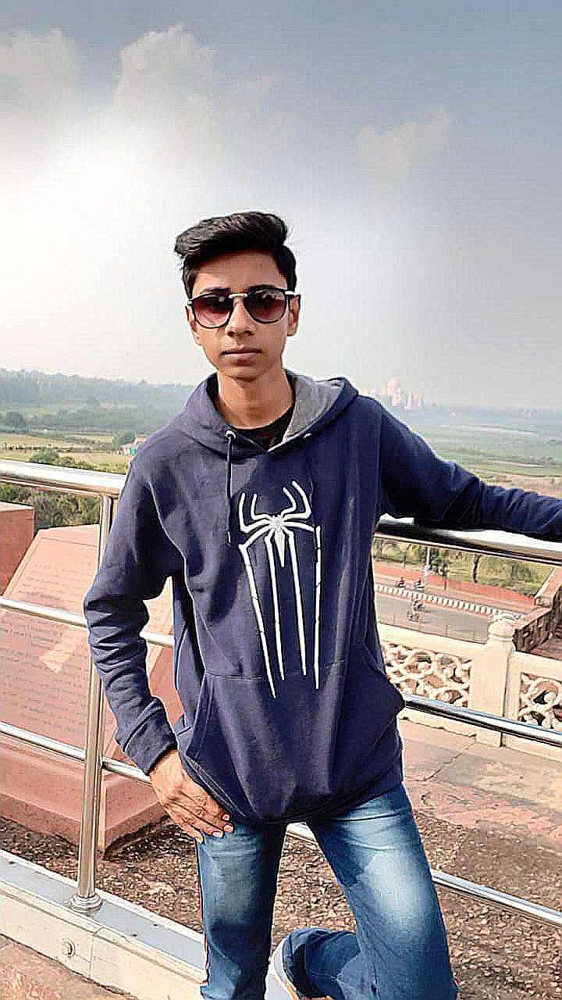

In [ ]:
#to enhance the edges

edgeEnahnced = im1.filter(ImageFilter.EDGE_ENHANCE)

moreEdgeEnahnced = im1.filter(ImageFilter.EDGE_ENHANCE_MORE)

#plt.imshow(edgeEnahnced)
#plt.show()
#plt.imshow(moreEdgeEnahnced)
#plt.show()

moreEdgeEnahnced

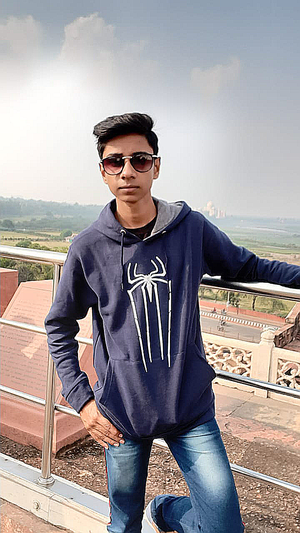

In [ ]:

basewidth = 300
#moreEdgeEnahnced = Image.open('moreEdgeEnahnced')
wpercent = (basewidth/float(moreEdgeEnahnced.size[0]))
hsize = int((float(moreEdgeEnahnced.size[1])*float(wpercent)))
moreEdgeEnahnced = moreEdgeEnahnced.resize((basewidth,hsize), Image.ANTIALIAS)



moreEdgeEnahnced

In [ ]:

basewidth = 300
#moreEdgeEnahnced = Image.open('moreEdgeEnahnced')
wpercent = (basewidth/float(moreEdgeEnahnced.size[0]))
hsize = int((float(moreEdgeEnahnced.size[1])*float(wpercent)))
moreEdgeEnahnced = moreEdgeEnahnced.resize((basewidth,hsize), Image.ANTIALIAS)




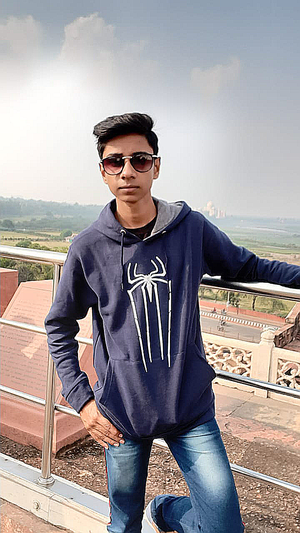

In [ ]:
moreEdgeEnahnced

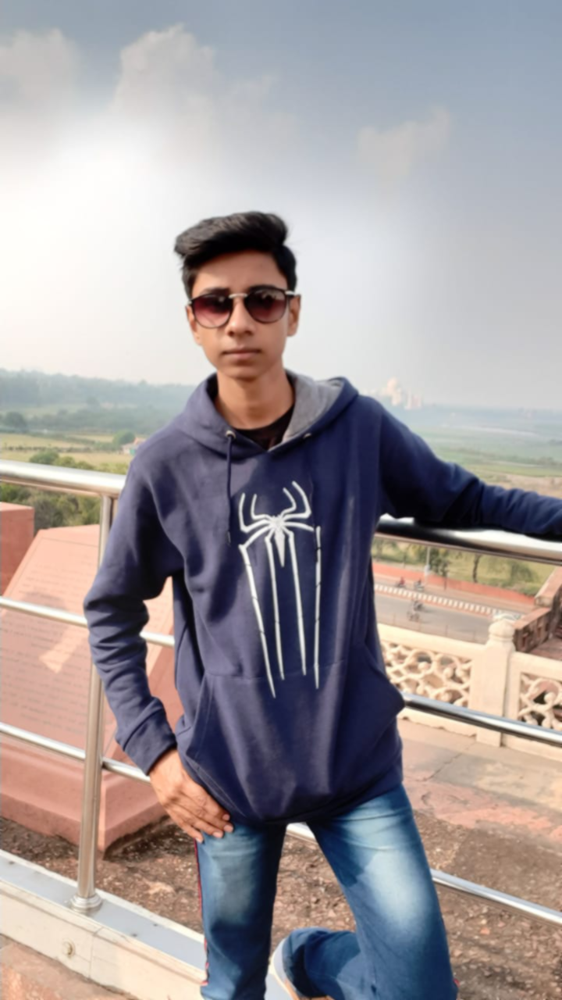

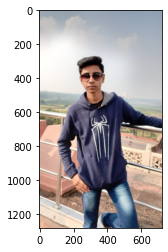

In [ ]:
# to make image smoother

moreSmoothenedImage = im1.filter(ImageFilter.SMOOTH_MORE)
moreSmoothenedImage.show()
plt.imshow(moreSmoothenedImage)
#plt.show()
moreSmoothenedImage

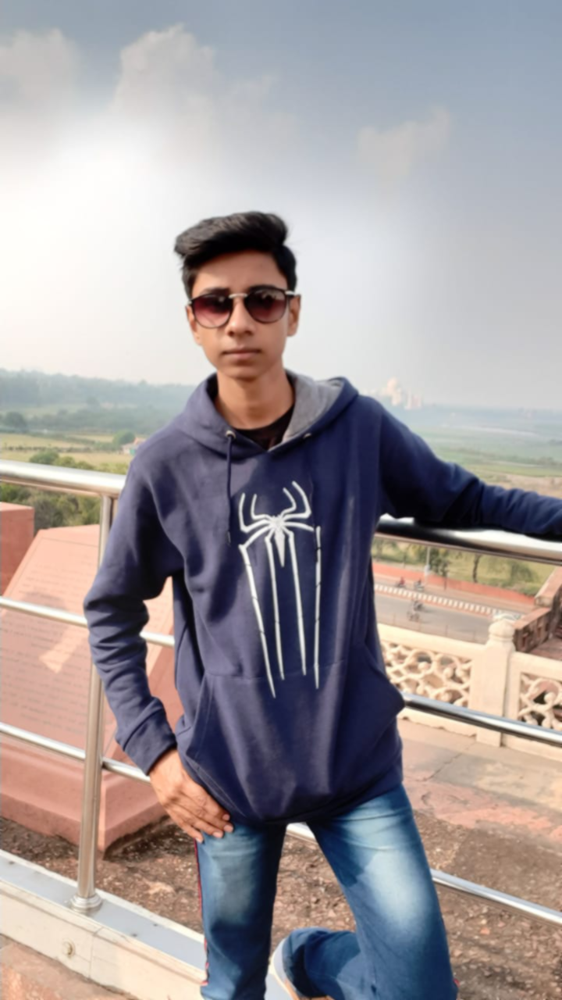

In [ ]:
moreSmoothenedImage

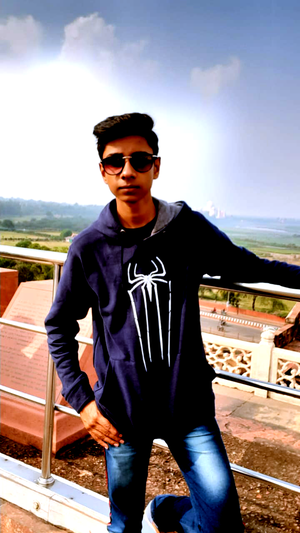

In [ ]:
# Method to process the red band of the image

def normalizeRed(intensity):

    iI      = intensity
    minI    = 86
    maxI    = 230
    minO    = 0
    maxO    = 255
    iO      = (iI-minI)*(((maxO-minO)/(maxI-minI))+minO)
    return iO

# Method to process the green band of the image

def normalizeGreen(intensity):
    iI      = intensity
    minI    = 90
    maxI    = 225
    minO    = 0
    maxO    = 255
    iO      = (iI-minI)*(((maxO-minO)/(maxI-minI))+minO)
    return iO

# Method to process the blue band of the image

def normalizeBlue(intensity):
    iI      = intensity
    minI    = 100
    maxI    = 210
    minO    = 0
    maxO    = 255
    iO      = (iI-minI)*(((maxO-minO)/(maxI-minI))+minO)
    return iO

# Create an image object

#imageObject     = Image.open("./glare4.jpg")

 

# Split the red, green and blue bands from the Image

multiBands      = im1.split()

 

# Apply point operations that does contrast stretching on each color band

normalizedRedBand      = multiBands[0].point(normalizeRed)

normalizedGreenBand    = multiBands[1].point(normalizeGreen)

normalizedBlueBand     = multiBands[2].point(normalizeBlue)

 

# Create a new image from the contrast stretched red, green and blue brands

normalizedImage = Image.merge("RGB", (normalizedRedBand, normalizedGreenBand, normalizedBlueBand))



basewidth = 300
#moreEdgeEnahnced = Image.open('moreEdgeEnahnced')
wpercent = (basewidth/float(normalizedImage.size[0]))
hsize = int((float(normalizedImage.size[1])*float(wpercent)))
normalizedImage = normalizedImage.resize((basewidth,hsize), Image.ANTIALIAS)

normalizedImage


#plt.imshow(normalizedImage)
#plt.show()

 

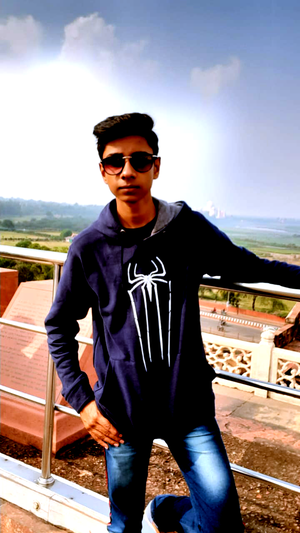

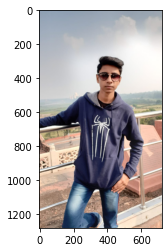

In [ ]:
#flip an image

flippedImage = im1.transpose(Image.FLIP_LEFT_RIGHT)
plt.imshow(flippedImage)
plt.show()

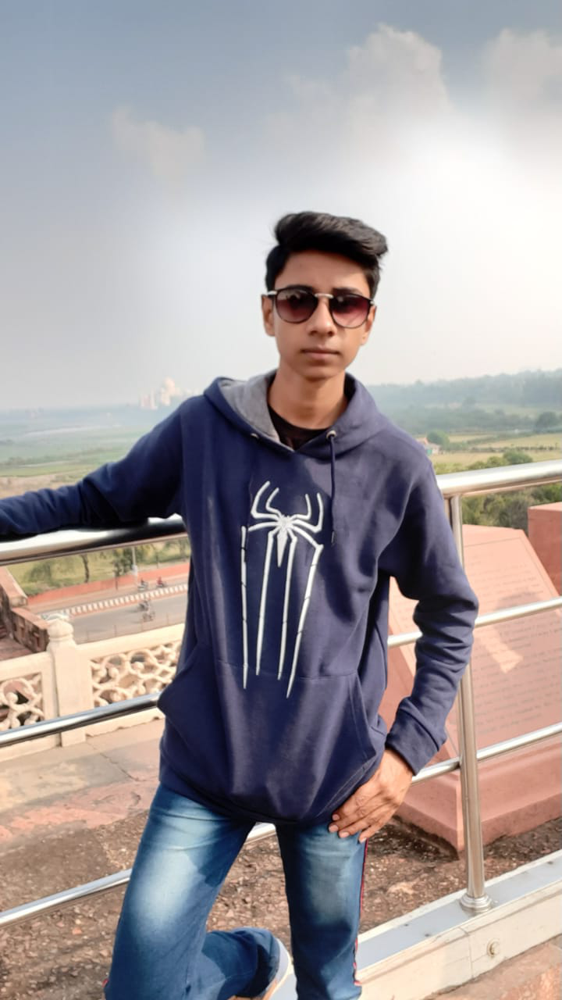

In [ ]:
flippedImage

In [ ]:
from PIL import Image

basewidth = 300
img = Image.open('/content/drive/My Drive/4.jpeg')
wpercent = (basewidth/float(img.size[0]))
hsize = int((float(img.size[1])*float(wpercent)))
img = img.resize((basewidth,hsize), Image.ANTIALIAS)
#img.save('sompic.jpg') 

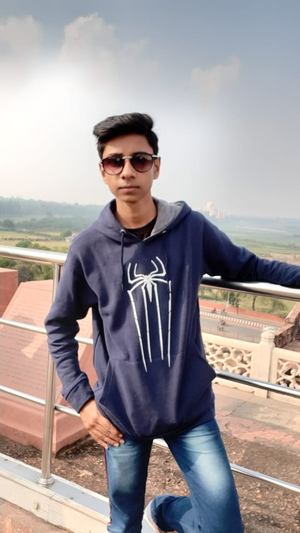

In [ ]:
img

In [ ]:
#rotate image

#rotate = input("1 for clockwise rotation and 2 for anticlockwise")

# rotating a image 90 deg counter clockwise 
im = im1.rotate(90, PIL.Image.NEAREST, expand = {rotate}) 

# to show specified image 
#im.show()
plt.imshow(im) 